In [1]:
import numpy as np, pandas as pd

X = pd.read_parquet('aliens.parquet')
X

,alfa_popsize,eyebrow_length,fenistraline_length,leash_v2,jacket_size,poloka_dash,holy_spirit,postojka,durk_durk_3d,noopster,...,turilla_jet,weight,moonlight_shadow_angle,jister_ml,leg_pollution,wallet_size,biceps,aga,da,ankle_diameter
0,1273.210288,702.271017,352.754646,231.456804,135.162385,346.578535,70.388229,267.221799,162.812146,21.265403,...,12.817179,15.780798,3988.159803,15.027182,105.348660,77.565442,2231.976885,3356.206251,293.846039,1197.658371
1,1762.800555,552.176524,-348.578448,302.617511,66.096273,263.098188,-8.442866,199.800693,103.495658,29.978779,...,9.937281,12.075288,5292.966511,12.453356,86.882948,78.007788,3301.213697,5074.654575,351.400080,873.291874
2,1154.081932,1119.631765,-36.358379,200.098293,125.907321,334.439139,-20.265494,-519.780573,92.247154,29.199713,...,10.743006,8.756796,3856.035673,9.495362,116.418115,116.255086,3092.423116,3994.874963,335.185582,917.447816
3,1181.661571,1320.341225,293.866657,283.972621,93.459372,187.442851,89.402673,1378.205958,81.806588,35.836450,...,12.429817,11.421948,2717.142060,11.670682,131.664278,83.969841,3367.527054,2292.256561,351.901315,1074.534454
4,751.251638,998.132123,-724.730649,420.987379,60.963099,360.790557,-1.074858,1195.690980,121.554328,31.706275,...,12.065884,13.341130,3085.229342,9.853778,65.249706,100.545740,3612.973208,2899.235214,381.034647,1291.965098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1137.424408,688.857438,-90.263352,359.489998,129.683610,204.562443,-2.465434,-673.451138,95.645700,30.638093,...,11.031228,11.272852,853.655181,9.978489,67.999854,80.942708,3128.648509,2521.916972,324.780635,741.554471
9996,913.314659,859.295109,-530.187880,245.904131,77.807249,210.272221,25.786245,1590.171122,78.089080,37.442741,...,13.409530,13.714980,2348.817593,11.211519,126.782365,136.199706,3412.368087,3085.193759,371.102727,964.564360
9997,1133.345522,1042.954915,-755.420158,381.826616,116.520283,381.432154,18.509690,915.191240,89.055504,28.955985,...,12.424673,12.504124,2797.610181,11.842874,113.771209,76.383984,2972.426857,2482.928050,185.922537,956.117409
9998,713.240822,830.693428,-45.059154,262.265291,105.215648,321.509325,-19.198133,-647.714991,104.694268,36.520347,...,9.752806,9.727836,2166.196991,14.512985,75.965236,96.475552,4224.427711,1885.344082,320.413597,1465.775898


In [2]:
from my_utils import get_df_info

In [3]:
get_df_info(X)

,dtype,nunique,example1,example2,zero,nan,empty_str,vc_max,vc_max_prop,trash_score
alfa_popsize,float64,10000,1273.210288,1762.800555,-1,-1,-1,135.865226,0.0,-1
eyebrow_length,float64,10000,702.271017,552.176524,-1,-1,-1,15.331027,0.0,-1
fenistraline_length,float64,10000,352.754646,-348.578448,-1,-1,-1,-986.982938,0.0,-1
leash_v2,float64,10000,231.456804,302.617511,-1,-1,-1,33.137488,0.0,-1
jacket_size,float64,10000,135.162385,66.096273,-1,-1,-1,10.803175,0.0,-1
poloka_dash,float64,10000,346.578535,263.098188,-1,-1,-1,28.229439,0.0,-1
holy_spirit,float64,10000,70.388229,-8.442866,-1,-1,-1,-116.228570,0.0,-1
postojka,float64,10000,267.221799,199.800693,-1,-1,-1,-3191.123799,0.0,-1
durk_durk_3d,float64,10000,162.812146,103.495658,-1,-1,-1,17.540078,0.0,-1
noopster,float64,10000,21.265403,29.978779,-1,-1,-1,1.770426,0.0,-1


Датафрейм чистый, состоит только из вещественных колонок. Отсутствующих значений нет.

## 1. tool: EmbeddingPlotter (6 баллов)

Нужно написать функцию, которая принимает на вход 2D/3D эмбеддинг и отрисовывает его (можно и через класс).<br>
Требуемый функционал описан в докстринге.

Нужно заметить, что основные преимущества bokeh в этом задании не нужны, однако использование bokeh для 2D обязательно в целях минимального освоения.
В дальнейшем вы сможете усовершенствовать вашу рисовалку с помощью ColumnDataSource и коллбэков, если захотите.

In [4]:
from bokeh.io import output_notebook
from bokeh.io import export_png
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, ColorBar, LinearColorMapper
from bokeh.transform import transform
from bokeh.palettes import Viridis, Viridis256
import plotly.express as px
import matplotlib.pyplot as pltimport
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import umap
from sklearn.cluster import KMeans
from tqdm import tqdm
import warnings
from IPython.display import Image
warnings.filterwarnings("ignore")

In [5]:
def embedding_plotter(embedding, data=None, hue=None, hover=None):
    """
    Рисовалка эмбеддинга. 2D renderer: bokeh. 3D renderer: plotly.
    Обязательные инструменты:
        - pan (двигать график)
        - box zoom
        - reset (вылезти из зума в начальное положение)

        embedding: something 2D/3D, slicable ~ embedding[:, 0] - валидно
            Эмбеддинг
        data: pd.DataFrame
            Данные, по которым был построен эмбеддинг
        hue: string
            Колонка из data, по которой красим точки. Поддерживает интерактивную легенду: по клику на каждое
                значение hue можно скрыть весь цвет.
        hover: string or list of strings
            Колонк[а/и] из data, значения которых нужно выводить при наведении мышки на точку

    """
    if not isinstance(embedding, np.ndarray):
        embedding = np.asarray(embedding)
    if embedding.shape[1] == 2:
        output_notebook()
        tools = [
            "lasso_select,undo,redo,wheel_zoom,box_select,box_zoom,pan,reset,hover"
        ]
        if hue:
            if data[hue].nunique() > 10:
                source_data = {
                    "x": embedding[:, 0],
                    "y": embedding[:, 1],
                }
                if data is not None:
                    if hue:
                        source_data[hue] = data[hue].values
                    if hover:
                        if isinstance(hover, str):
                            source_data[hover] = data[hover]
                        else:
                            for col in hover:
                                source_data[col] = data[col]

                source = ColumnDataSource(source_data)
                color_mapper = LinearColorMapper(
                    palette=Viridis256, low=data[hue].min(), high=data[hue].max()
                )
                tooltips = [("index", "$index"), ("(x,y)", "($x, $y)")]
                if hover:
                    if isinstance(hover, str):
                        tooltips += [(hover, f"@{hover}")]
                    else:
                        tooltips += [(col, f"@{col}") for col in hover]
                fig = figure(height=500, width=800, tools=tools, tooltips=tooltips)
                fig.scatter(
                    x="x",
                    y="y",
                    legend_label=f"hue = {hue}",
                    color=transform(hue, color_mapper),
                    source=source,
                )
                color_bar = ColorBar(
                    color_mapper=color_mapper,
                    label_standoff=12,
                    location=(0, 0),
                    title=hue,
                )
                fig.add_layout(color_bar, "right")
                fig.legend.location = "bottom_left"
                fig.legend.click_policy = "hide"

            else:
                palette = Viridis[data[hue].nunique()]
                tooltips = [("index", "$index"), ("(x,y)", "($x, $y)")]
                if hover:
                    if isinstance(hover, str):
                        tooltips += [(hover, f"@{hover}")]
                    else:
                        tooltips += [(col, f"@{col}") for col in hover]

                fig = figure(height=500, width=800, tools=tools, tooltips=tooltips)
                for i, color in enumerate(np.sort(data[hue].unique())):
                    data_tmp = data[data[hue] == color]
                    source_data = {
                        "x": embedding[data[hue] == color, 0],
                        "y": embedding[data[hue] == color, 1],
                    }
                    if data is not None:
                        if hue:
                            source_data[hue] = data_tmp[hue].values
                        if hover:
                            if isinstance(hover, str):
                                source_data[hover] = data_tmp[hover].values
                            else:
                                for col in hover:
                                    source_data[col] = data_tmp[col].values
                    source = ColumnDataSource(source_data)

                    fig.scatter(
                        x="x",
                        y="y",
                        color=palette[i],
                        source=source,
                        legend_group=hue,
                    )
                    fig.legend.title = f"hue: {hue}"
                    fig.legend.location = "bottom_left"
                    fig.legend.click_policy = "hide"
        else:
            source_data = {
                "x": embedding[:, 0],
                "y": embedding[:, 1],
            }
            if data is not None:
                if hover:
                    if isinstance(hover, str):
                        source_data[hover] = data[hover]
                    else:
                        for col in hover:
                            source_data[col] = data[col]

            source = ColumnDataSource(source_data)
            tooltips = [("index", "$index"), ("(x,y)", "($x, $y)")]
            if hover:
                if isinstance(hover, str):
                    tooltips += [(hover, f"@{hover}")]
                else:
                    tooltips += [(col, f"@{col}") for col in hover]
                fig = figure(height=500, width=800, tools=tools, tooltips=tooltips)
            else:
                fig = figure(height=500, width=800, tools=tools)
            fig.scatter(
                x="x",
                y="y",
                source=source,
            )
        show(fig)
    elif embedding.shape[1] == 3:
        df = data
        if hue is not None:
            df[hue] = df[hue].astype(str)
        fig = px.scatter_3d(
            df,
            x=embedding[:, 0],
            y=embedding[:, 1],
            z=embedding[:, 2],
            color=hue,
            hover_data=hover,
        )
        fig.update_traces(marker_size=1, selector=dict(type="scatter3d"))

        fig.show()
    else:
        raise ValueError("Embedding must have exactly 2 or 3 dimensions.")

Приведите пример работы рисовалки на 2D и 3D данных. В качестве эмбеддингов возьмите какие-нибудь признаки из данных выше.

Добавим категориальную колонку, например разобьем на бины колонку `alfa_popsize`.

In [6]:
X_with_cat = X.copy()
X_with_cat['cat'] = (round(X_with_cat['alfa_popsize'])//300).astype('int64')

In [7]:
embedding_plotter(np.asarray(X_with_cat[['leg_pollution','eyebrow_length']]),
                  data=X_with_cat, hue='cat', hover=['leash_v2','leg_pollution'])

Loading BokehJS ...

In [8]:
embedding_plotter(np.asarray(X_with_cat[['leg_pollution','eyebrow_length']]),
                  data=X_with_cat, hue='wallet_size', hover=['leash_v2','leg_pollution'])

Loading BokehJS ...

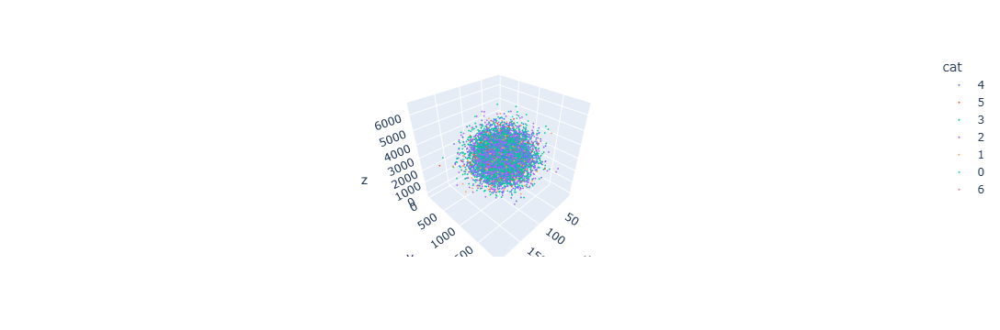

In [9]:
embedding_plotter(np.asarray(X_with_cat[['leg_pollution', 'eyebrow_length', 'biceps']]),
                  data=X_with_cat, hue='cat', hover=['leash_v2','leg_pollution'])
# Image('3.png')

**! Если вы написали рисовалку, используйте ее в части 2 для отрисовки эмбеддингов**

## 2 Инопланетное вторжение

В разгар войны с инопланетянами в сеть утекли данные о десяти тысячах инопланетных особей, описанных странными показателями.
Никто не знает, что они значат, но все видят своими глазами, что среди инопланетян встречается пять существенно отличающихся видов, а также особи, которые трудно отнести к какому-либо виду.
Ваша задача по полученным данным произвести кибер-разведку и определить, к какому из видов относится каждый представленный в табличке субъект. Вы не знаете, как называются виды и чем именно из представленного в табличке они отличаются, но есть специалисты, готовые взять на себя подобную расшифровку.
Ваша задача - предоставить им разбиение данной таблички на кластеры (возможно, с шумом), чтобы они смогли начать анализ.

In [10]:
X.head()

,alfa_popsize,eyebrow_length,fenistraline_length,leash_v2,jacket_size,poloka_dash,holy_spirit,postojka,durk_durk_3d,noopster,...,turilla_jet,weight,moonlight_shadow_angle,jister_ml,leg_pollution,wallet_size,biceps,aga,da,ankle_diameter
0,1273.210288,702.271017,352.754646,231.456804,135.162385,346.578535,70.388229,267.221799,162.812146,21.265403,...,12.817179,15.780798,3988.159803,15.027182,105.348660,77.565442,2231.976885,3356.206251,293.846039,1197.658371
1,1762.800555,552.176524,-348.578448,302.617511,66.096273,263.098188,-8.442866,199.800693,103.495658,29.978779,...,9.937281,12.075288,5292.966511,12.453356,86.882948,78.007788,3301.213697,5074.654575,351.400080,873.291874
2,1154.081932,1119.631765,-36.358379,200.098293,125.907321,334.439139,-20.265494,-519.780573,92.247154,29.199713,...,10.743006,8.756796,3856.035673,9.495362,116.418115,116.255086,3092.423116,3994.874963,335.185582,917.447816
3,1181.661571,1320.341225,293.866657,283.972621,93.459372,187.442851,89.402673,1378.205958,81.806588,35.836450,...,12.429817,11.421948,2717.142060,11.670682,131.664278,83.969841,3367.527054,2292.256561,351.901315,1074.534454
4,751.251638,998.132123,-724.730649,420.987379,60.963099,360.790557,-1.074858,1195.690980,121.554328,31.706275,...,12.065884,13.341130,3085.229342,9.853778,65.249706,100.545740,3612.973208,2899.235214,381.034647,1291.965098


### 2.1 Понижение размерности (4 балла)

Чтобы быть уверенным в своей кластеризации, нужно иметь возможность посмотреть на нее глазами, поэтому для начала постараемся получить 2D-эмбеддинг нашей таблички.
Сделайте это на всех признаках с помощью PCA и t-SNE/UMAP с адекватными гиперпараметрами (2 разных картинки). Сделайте необходимую предобработку. Отрисуйте это вашей рисовалкой из первой части, если вы ее сделали. Что вы видите?

### Решение

2D-эмбеддинг с помощью PCA

In [11]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA(n_components=2, random_state=8)
embedding_PCA = pca.fit_transform(X_scaled)
embedding_plotter(embedding_PCA, X_scaled)

Loading BokehJS ...

2D-эмбеддинг с помощью UMAP

In [12]:
embedding_umap = umap.UMAP(
    n_components=2,
    n_neighbors=30,
    a=1.0,
    b=0.5,
    metric='euclidean',
    n_epochs=500,
    verbose=True,
    init='pca',
    n_jobs=-1,
    random_state=8
).fit_transform(X.values)
embedding_plotter(embedding_umap, X)

UMAP(a=1.0, b=0.5, init='pca', n_epochs=500, n_jobs=1, n_neighbors=30, random_state=8, verbose=True)
Mon Mar 31 00:11:23 2025 Construct fuzzy simplicial set
Mon Mar 31 00:11:23 2025 Finding Nearest Neighbors
Mon Mar 31 00:11:23 2025 Building RP forest with 10 trees
Mon Mar 31 00:11:26 2025 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Mon Mar 31 00:11:37 2025 Finished Nearest Neighbor Search
Mon Mar 31 00:11:40 2025 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Mon Mar 31 00:11:58 2025 Finished embedding


Loading BokehJS ...

После некоторого подбора параметров можно увидеть, что UMAP достаточно хорошо может справляться с кластеризацией для данной задачи, это видно на отрисованном графике выше.

Что же касается PCA, то тут все похуже. После понижения размерности на графике разве что еле видны 4 центра, которые практически слипаются и лишь один четко отделившийся. Также, стоит отметить, что для PCA в целях получения хоть сколько-нибудь информативной картины необходимо было стандартизировать предварительно данные.

### Задание

Давайте попробуем улучшить ситуацию. Найдите любым кажущимся вам разумным способом (опишите, что делали) то подмножество признаков, по которому разные виды инопланетян могут отличаться.
Постройте и отрисуйте на этом подмножестве признаков такой 2D-эмбеддинг, на котором данные однозначным и убедительным образом делятся на 5 кластеров (чем отчетливей и убедительней, тем больше баллов :).
Для этого, возможно, придется поиграться с гиперпараметрами методов понижения размерности.

В блоке ниже отрисовываются эмбеддинги с цветом по всем колонкам. Таким образом, можно увидеть, какие колонки влияют на то, к какому кластеру относится объект.

P.S. Не стал отображать все картинки, оставил только по тем признакам, что отобрал для дальнейшей работы, чтобы не нагромождать ноутбук.

In [13]:
# for col in X.columns:
#     embedding_plotter(embedding_umap, X, hue=col)

Выделим 5 колонок, которые судя по раскрасу графиков вносят некоторую зависимость.

In [14]:
selected_cols = ['fenistraline_length', 'holy_spirit', 'postojka', 'yi_212', 'baz200']
X_selected_cols = X[selected_cols]

In [15]:
for col in selected_cols:
    embedding_plotter(embedding_umap, X, hue=col)

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Отнормируем данные с помощью `StandardScaler()` и попробуем отрисовать полученный результат (уже на 5 отобранных признаках, а не всех 25 исходных).

In [16]:
scaler = StandardScaler()
X_scaled_selected_cols = scaler.fit_transform(X_selected_cols)
pca_selected_cols = PCA(n_components=2, random_state=8)
embedding_PCA_sel = pca_selected_cols.fit_transform(X_scaled_selected_cols)
embedding_plotter(embedding_PCA_sel, X_scaled_selected_cols)

Loading BokehJS ...

Можно увидеть, что картина разделения с помощью PCA слегка улучшилась.

In [17]:
X_selected = X.copy()
X_selected = X_selected[selected_cols]
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_selected),columns = X_selected.columns)

In [18]:
embedding_umap = umap.UMAP(
    n_components=2,
    n_neighbors=50,
    a=1,
    b=0.55,
    metric='l1',
    n_epochs=500,
    verbose=True,
    init='pca',
    n_jobs=-1,
    random_state=4
).fit_transform(X_scaled.values)
embedding_plotter(embedding_umap, X_scaled)

UMAP(a=1, b=0.55, init='pca', metric='l1', n_epochs=500, n_jobs=1, n_neighbors=50, random_state=4, verbose=True)
Mon Mar 31 00:11:59 2025 Construct fuzzy simplicial set
Mon Mar 31 00:11:59 2025 Finding Nearest Neighbors
Mon Mar 31 00:11:59 2025 Building RP forest with 10 trees
Mon Mar 31 00:11:59 2025 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Mon Mar 31 00:12:07 2025 Finished Nearest Neighbor Search
Mon Mar 31 00:12:07 2025 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Mon Mar 31 00:12:27 2025 Finished embedding


Loading BokehJS ...

В итоге, с помощью предобработки данных + UMAP получили достаточно четкое разделение на 5 кластеров, которое и будем использовать далее.

### 2.2 Кластеризация (5 баллов)

Давайте теперь разобьем получившийся эмбеддинг на кластеры. Для этого выберите алгоритм кластеризации, который по-вашему сможет справиться с задачей.
Объясните свой выбор, а также выбор гиперпараметров. Запустите кластеризацию и отрисуйте получившиеся кластеры. Сделайте так, чтобы кластеры получились максимально адекватными (чем адекватней, тем больше баллов :).

### Решение

Как было видно из графиков, построенных выше, понижение размерности с помощью UMAP дало хорошее разделение кластеров. На графике все кластеры линейно разделимы, поэтому нам достаточно будет KMeans. Также, используя KMeans, мы меньше рискуем случайно отнести какой-нибудь объект из одного скопления в другой кластер.

In [19]:
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(embedding_umap)

In [20]:
X_with_hue = X.copy()
X_with_hue['hue'] = clusters

In [21]:
embedding_plotter(embedding_umap, X_with_hue, hue='hue')

Loading BokehJS ...

Посмотрим, в каком соотношении поделились объекты на кластеры:

In [22]:
np.unique(clusters, return_counts=True)

(array([0, 1, 2, 3, 4]), array([2017, 2001, 1963, 1986, 2033], dtype=int64))

Как видим, получили 5 кластеров, причем все кластеры приблизительно равномощны.

Теперь у нас есть кластеризация, которую можно отправить специалистам! Это почти все!

Напоследок, попробуйте получить такую же кластеризацию, запустив алгоритм на пространстве размерности больше трех. Выберите адекватное подмножество признаков и алгоритм.
Выберите метрику качества кластеризации, которую будете использовать. Объясните свой выбор.

In [23]:
# ваш ответ

С помощью optuna подберите гиперпараметры, которые дают наилучшую метрику качества кластеризации (нужно попробовать не менее 21 различных адекватных вариантов).
Запустите алгоритм кластеризации с наилучшими гиперпараметрами на выбранном подмножестве признаков и отрисуйте получившиеся кластеры на вашем полученном в части 2.1 эмбеддинге.

In [24]:
# ваш код

Какие выводы можно сделать из увиденного?

In [25]:
# ваш ответ

# Ура! Всем хорошего нового года!  |:--)